# Advanced Lane Finding

This project aims at building a pipeline to find the lanes from a forward facing camera and generate an output video that shows the lane, radius of curvautre and the vehicle position with respect to the lane.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
import glob
import os
%matplotlib inline

## Distortion Correction

Remove camera distortion by calculating camera calibration matrix and distortion co-efficients from chessboard images

In [2]:
chessimg = glob.glob(os.path.join('camera_cal', 'calibration*.jpg'))
chessver = 6
chesshor = 9

In [3]:
def plotsample(orgimg, modimg, sample=4, orglabel="original", modlabel="modfied", figsize=(9,6), singlechannel=False):
    '''
    This function plots either all of the original and modified images,
    or a few of them determined by the sample
    '''
    idx = np.random.choice(len(orgimg), size=sample, replace=False)
    neworgimg = orgimg[idx]
    mod_img = modimg[idx]
    for org_img, trans_img in zip(neworgimg, mod_img):
        figure, (axs1, axs2) = plt.subplots(1,2, figsize=figsize)
        axs1.imshow(cv2.cvtColor(org_img, cv2.COLOR_BGR2RGB))
        axs1.set_title(orglabel)
        if not singlechannel:
            axs2.imshow(cv2.cvtColor(trans_img, cv2.COLOR_BGR2RGB))
        else:
            axs2.imshow(trans_img, cmap='gray')
        axs2.set_title(modlabel)

In [4]:
def findobjimagepoints(imagelist, chessver, chesshor):
    '''
    A method to find the object and image points from a chess board
    calibration image
    '''
    # Arrays to store object and image points from the chessboard images
    objpoints = [] # 3d points in real world
    imgpoints = [] # 2D points in image plane

    objp = np.zeros((chessver * chesshor, 3), np.float32)
    objp[:,:2] = np.mgrid[0:chesshor, 0:chessver].T.reshape(-1,2)
    
    chesscorndetect = []
    orgchessimg = []
    
    for idx,img in enumerate(imagelist):
        imgr = cv2.imread(img)
        gray = cv2.cvtColor(imgr, cv2.COLOR_BGR2GRAY)
        
        # Get chess board corner
        ret, corners = cv2.findChessboardCorners(gray, (chesshor, chessver), None)
        
        # If points are found add to list
        if ret:
            orgchessimg.append(imgr.copy())
            objpoints.append(objp)
            imgpoints.append(corners)
            
            # Draw the chess board corners
            cv2.drawChessboardCorners(imgr, (chesshor, chessver), corners, ret)
            chesscorndetect.append(imgr)
    
    return objpoints, imgpoints, np.array(orgchessimg), np.array(chesscorndetect)

In [5]:
objpoints, imgpoints, orgchessimg, chesscorndetect  = findobjimagepoints(chessimg, chessver, chesshor)

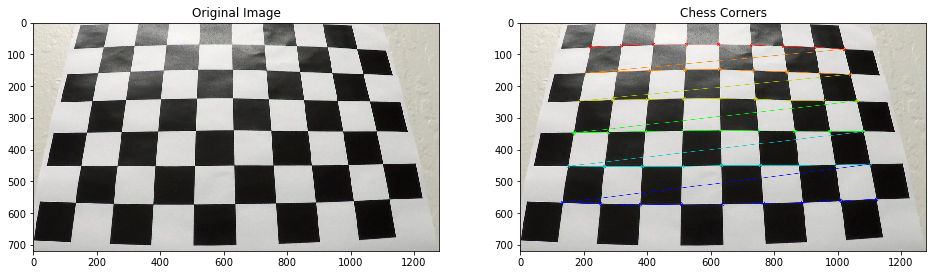

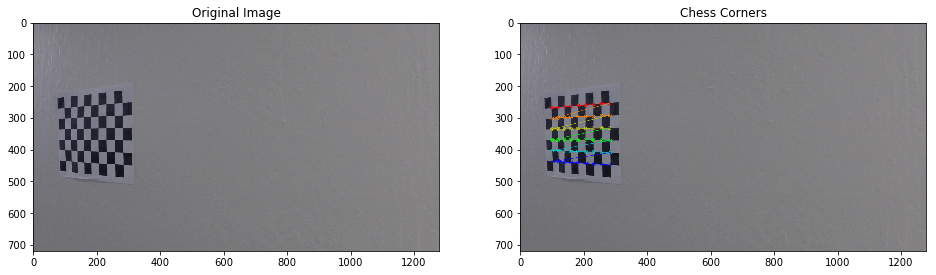

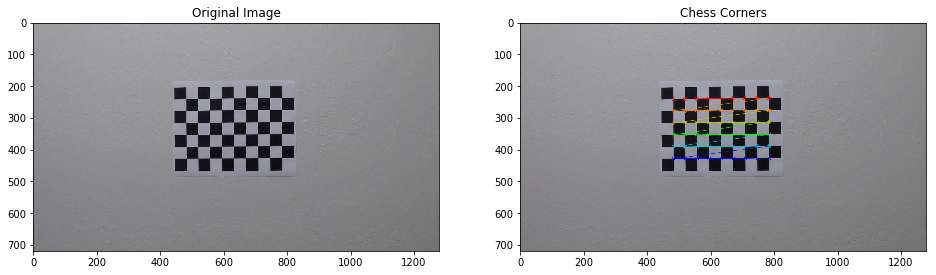

In [7]:
# Sample of Detected Chess Board Corners
plotsample(orgchessimg, chesscorndetect, sample=3, orglabel="Original Image", modlabel="Chess Corners", figsize=(16,9))

In [8]:
# Un distort image using the camera calibration

def undistortimage(orgimage, objpoints, imgpoints):
    '''
    A function to undistort images based on camera cal matrix
    '''
    img_shape = (orgimage.shape[1], orgimage.shape[0]) # row, column
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_shape, None, None)
    undist = cv2.undistort(orgimage, mtx, dist, None, mtx)
    return undist

In [9]:
test_path = glob.glob(os.path.join('test_images', 'test*.jpg'))
test_images = []
undist_images = []
for impath in test_path:
    img = cv2.imread(impath)
    test_images.append(img.copy())
    undist_images.append(undistortimage(img, objpoints, imgpoints))

test_images = np.array(test_images)
undist_images = np.array(undist_images)

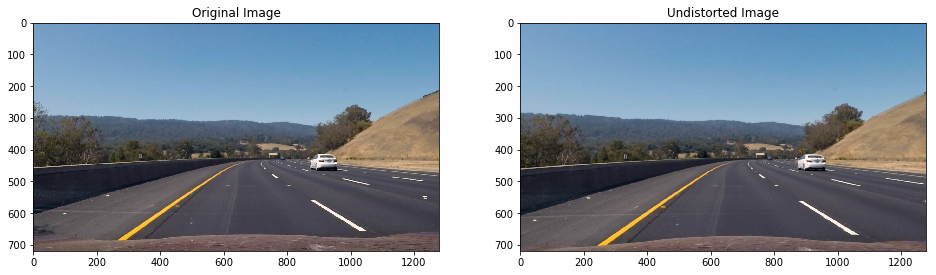

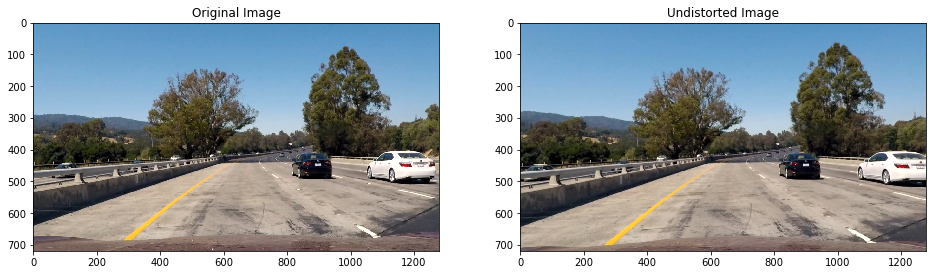

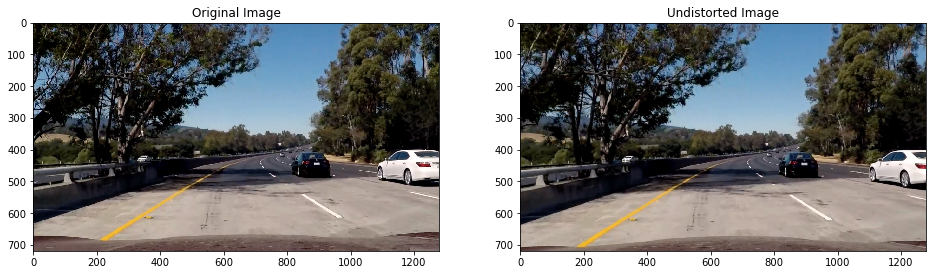

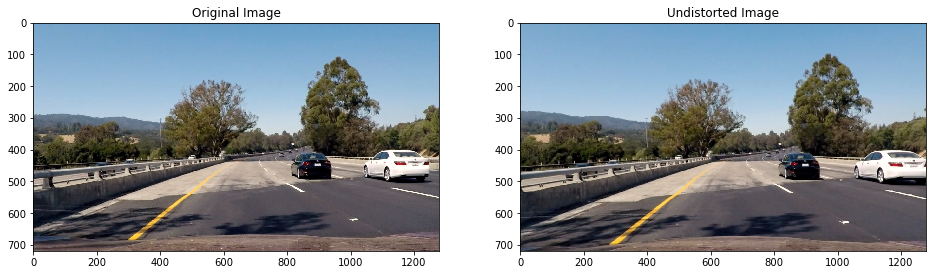

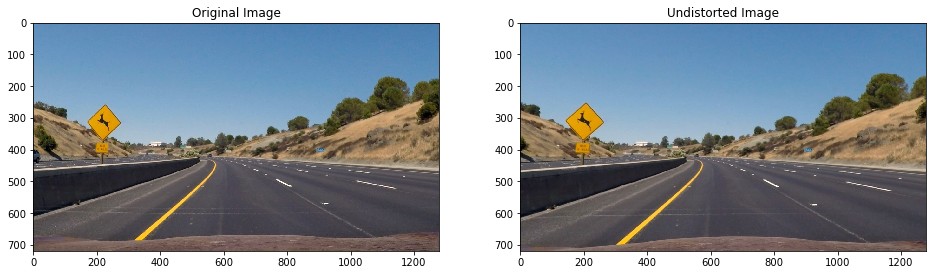

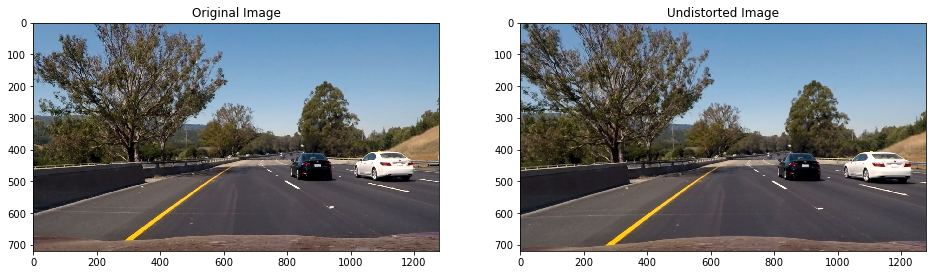

In [10]:
# display undistorted image
plotsample(test_images, undist_images, sample=6, orglabel="Original Image", modlabel="Undistorted Image", figsize=(16,9))

## Perspective Transform

In this step only the lane lines in the images are considered which is the intresting feature for the pipeline. Here the lane lines are transformed using top view, so that the lanes appear parallel instead of converging at the end. This is needed in order to determine the lane polynomials and its curvature.

In [48]:
# Perspective Transform
def getperspective(img, undist_img, src, dst):
    '''
    This function converts the image in to a top perpective view of the lane lines.
    '''
    img_shape = (img.shape[1], img.shape[0])
    perspect_mat = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist_img, perspect_mat, img_shape)
    return warped, perspect_mat
    

In [34]:
# Define Source and Destination points to perform perspective transform
src = np.float32([[490, 480], [810, 480], [1250, 720], [100, 720]])
dst = np.float32([[0,0], [1280,0], [1250, 720], [100, 720]])

warp_img = []
persp_mat = []
for t_img, und_img in zip(test_images, undist_images):
    temp_img, temp_mat = getperspective(t_img, und_img, src, dst)
    warp_img.append(temp_img)
    persp_mat.append(temp_mat)

warp_img = np.array(warp_img)

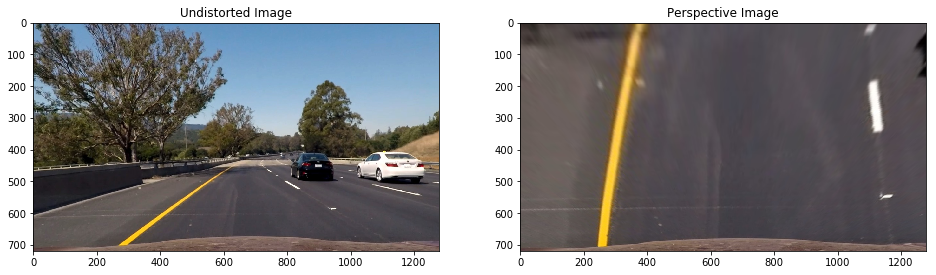

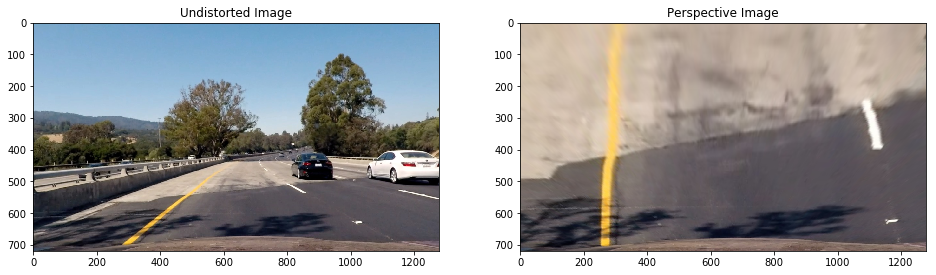

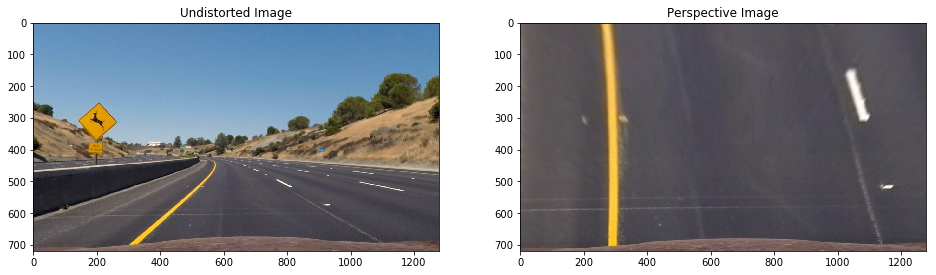

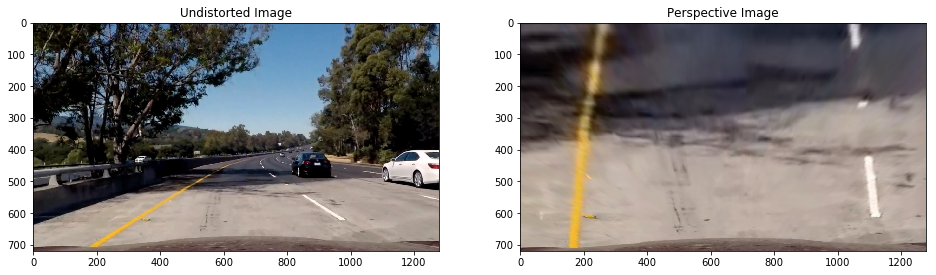

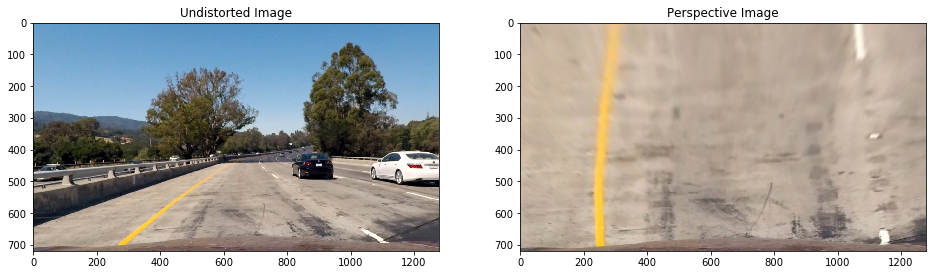

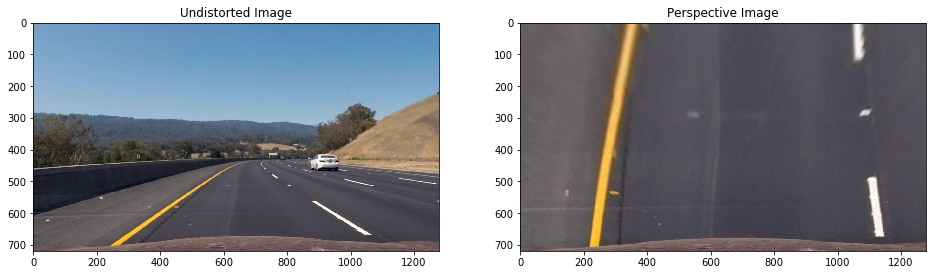

In [35]:
# display undistorted image
plotsample(undist_images, warp_img, sample=6, orglabel="Undistorted Image", modlabel="Perspective Image", figsize=(16,9))

## Test of different Binary threholds and colour spaces

In this step the warped image is converted to differnt colour channels to extract binary threshold images. Differnt colour spaces will be used to determine which combination extract all the lane information.

In [64]:
# get HLS binary
def getHLS(img, thresh=(0,255)):
    '''
    Function to get HLS threshold of the image
    '''
    # Convert to HLS Color Space
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    # Apply a threshold to S channel
    s_channel = hls[:,:,2]
    binary = np.zeros_like(s_channel)
    binary[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary

In [37]:
s_binary = []
for img in warp_img:
    s_binary.append(getHLS(img, thresh=(150, 255)))

s_binary = np.array(s_binary)

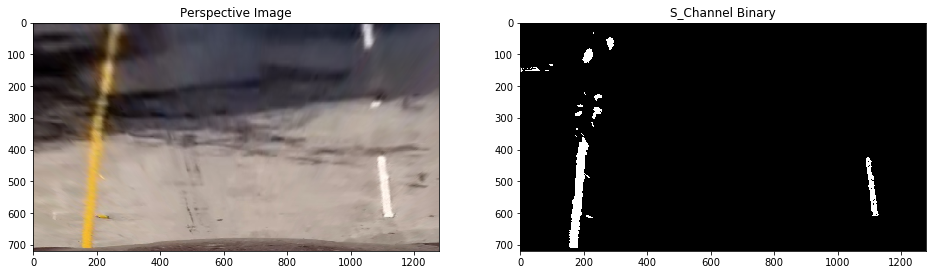

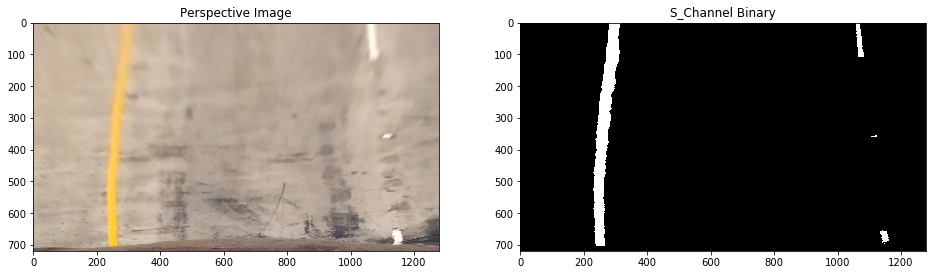

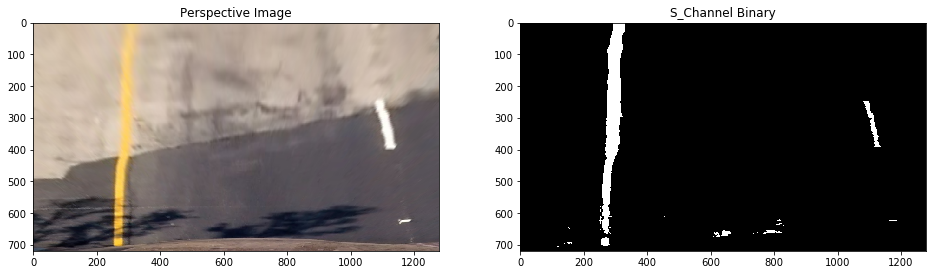

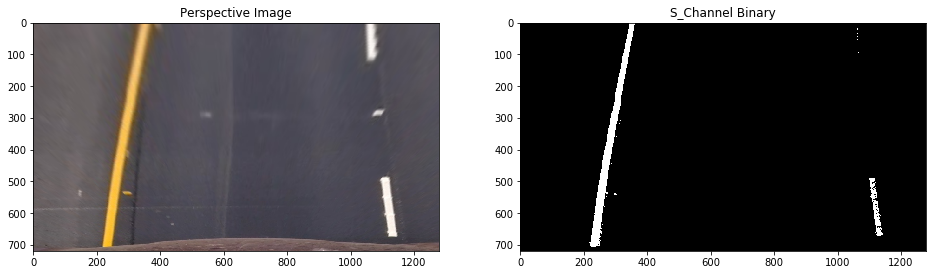

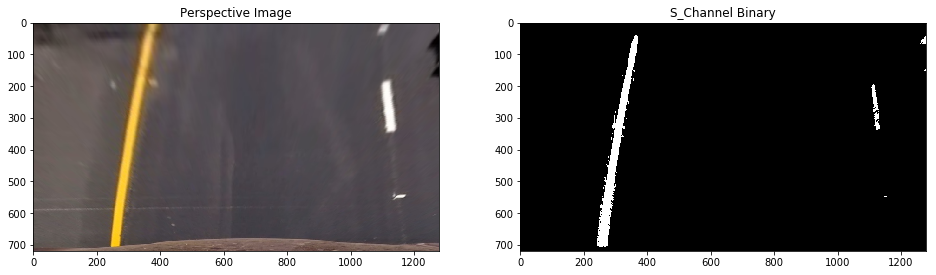

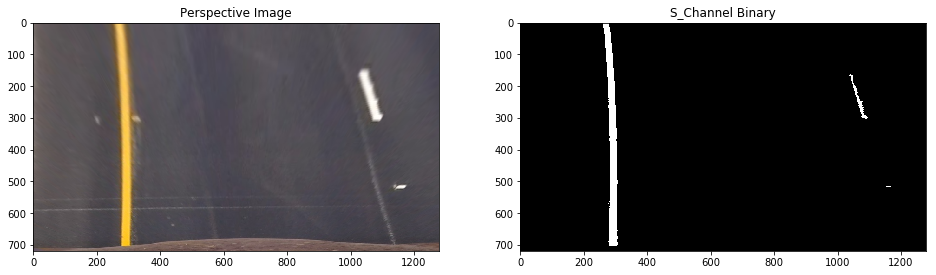

In [38]:
# Display S_channel detection capabilites
plotsample(warp_img, s_binary, sample=6, orglabel="Perspective Image", modlabel="S_Channel Binary", figsize=(16,9), singlechannel=True)

In [58]:
# get LUV binary
def getLUV(img, thresh=(0,255)):
    '''
    Function to get LUV threshold of the image
    '''
    # Convert to LUV Color Space
    luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    # Apply a threshold to L channel
    l_channel = luv[:,:,0]
    binary = np.zeros_like(l_channel)
    binary[(l_channel > thresh[0]) & (l_channel <= thresh[1])] = 1
    return binary

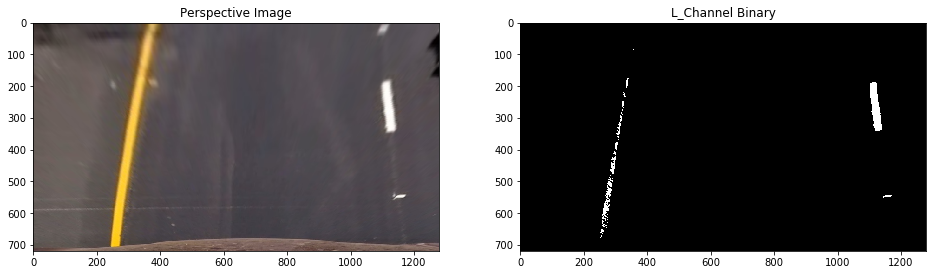

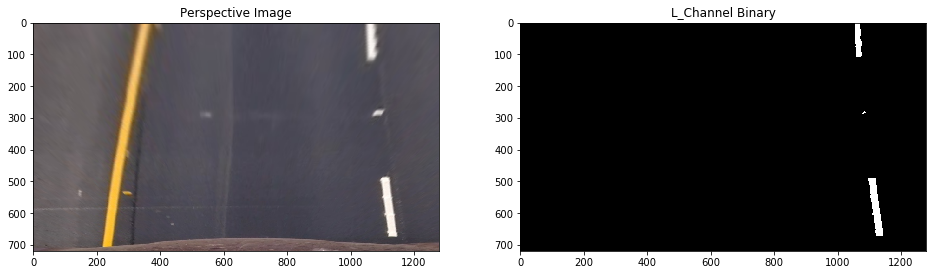

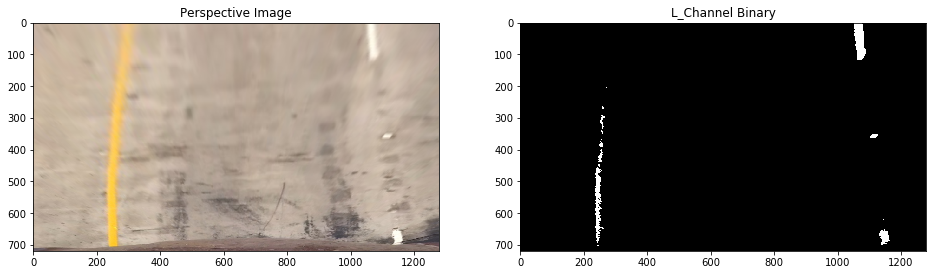

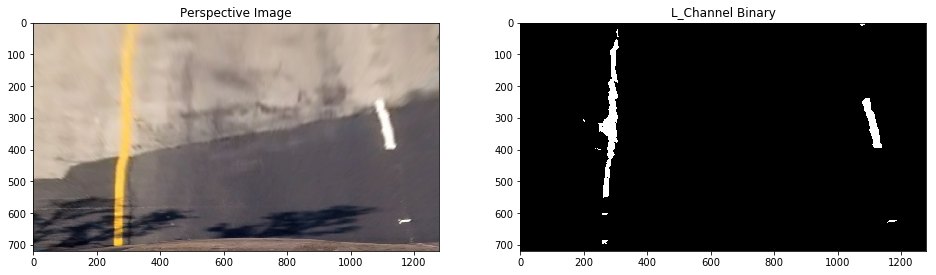

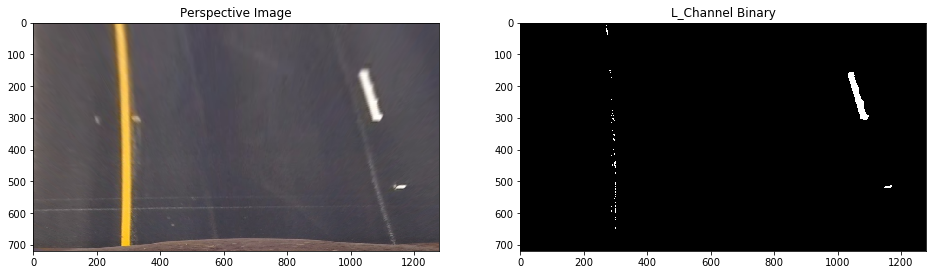

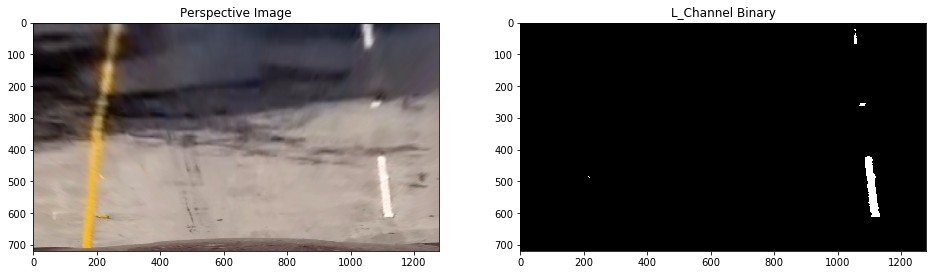

In [40]:
l_binary = []
for img in warp_img:
    l_binary.append(getLUV(img, thresh=(215, 255)))

l_binary = np.array(l_binary)

# Display S_channel detection capabilites
plotsample(warp_img, l_binary, sample=6, orglabel="Perspective Image", modlabel="L_Channel Binary", figsize=(16,9), singlechannel=True)

In [70]:
# get Lab binary
def getLab(img, thresh=(0,255)):
    '''
    Function to get LUV threshold of the image
    '''
    # Convert to LUV Color Space
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    # Apply a threshold to L channel
    b_channel = lab[:,:,2] # b is for blue-yellow (Since we want to detect yellow lines better)
    binary = np.zeros_like(b_channel)
    binary[(b_channel > thresh[0]) & (b_channel <= thresh[1])] = 1
    return binary

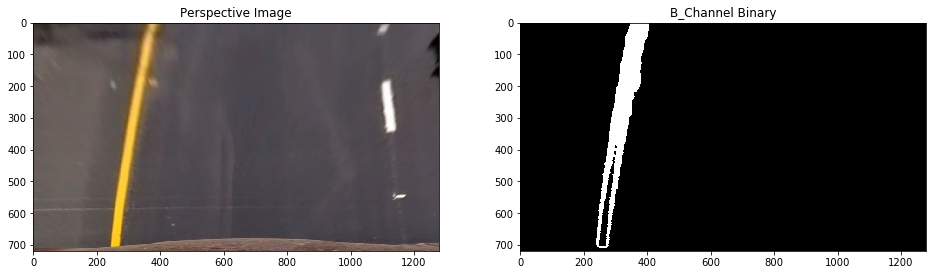

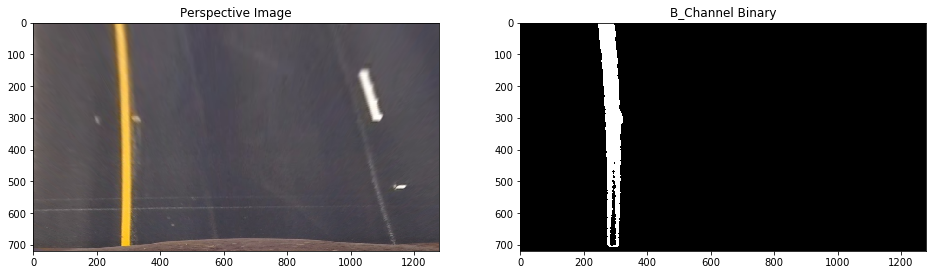

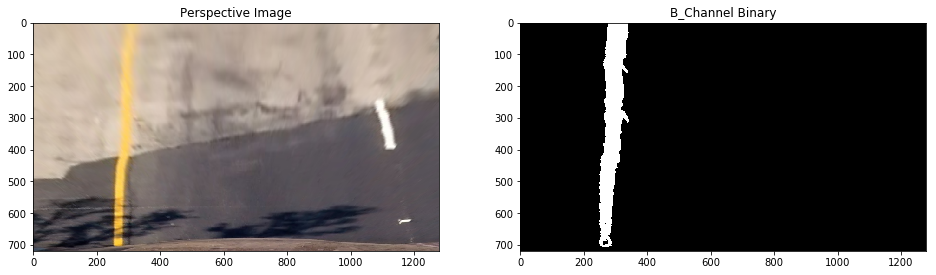

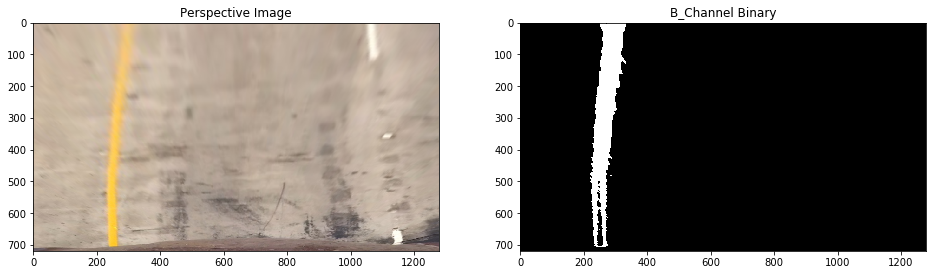

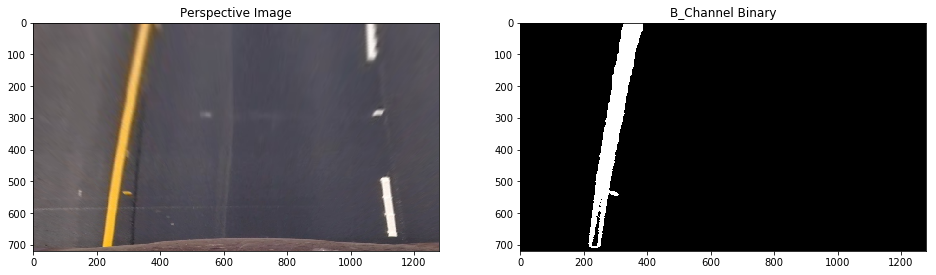

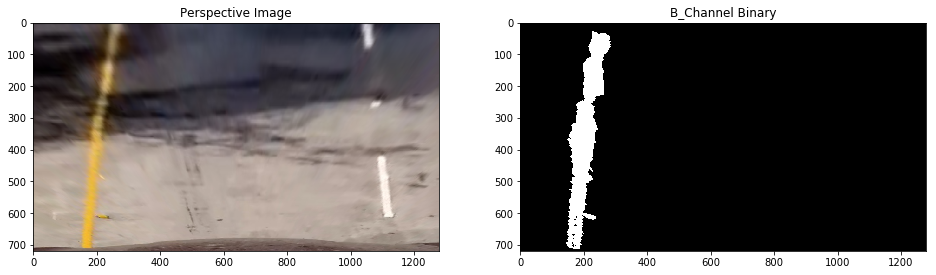

In [42]:
b_binary = []
for img in warp_img:
    b_binary.append(getLab(img, thresh=(145, 200)))

b_binary = np.array(b_binary)

# Display S_channel detection capabilites
plotsample(warp_img, b_binary, sample=6, orglabel="Perspective Image", modlabel="B_Channel Binary", figsize=(16,9), singlechannel=True)

L channel in LUV and b Channel Lab detects white line and Yellow with high accuracy on the warped image. Combining L channel and b channel will yield better lane detection

In [83]:
def combine_channel(channel1, channel2):
    '''
    This funciton combines any given two channels
    '''
    combined_channels = np.zeros_like(channel1)
    combined_channels[(channel1 == 1) | (channel2 == 1)] = 1
    return combined_channels

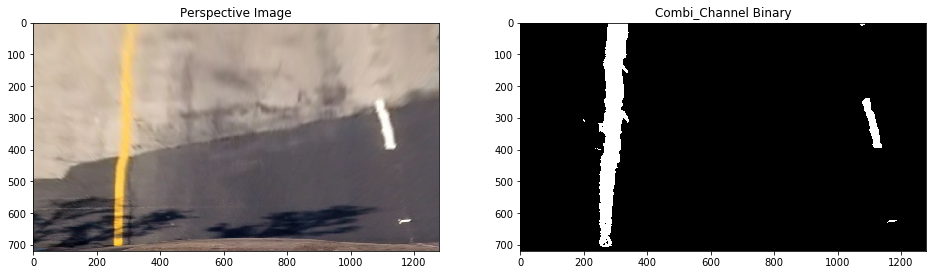

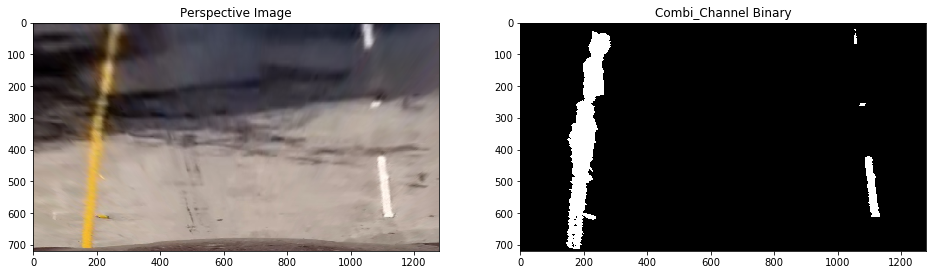

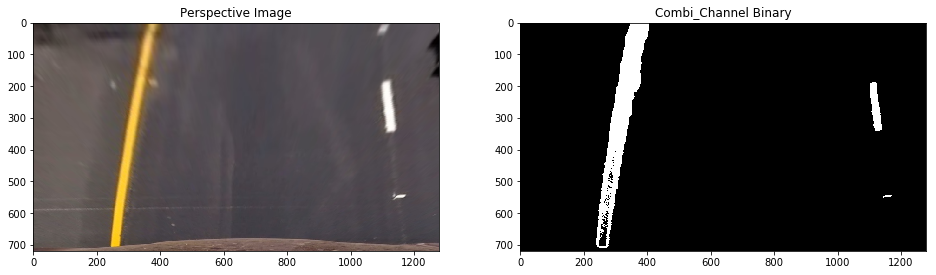

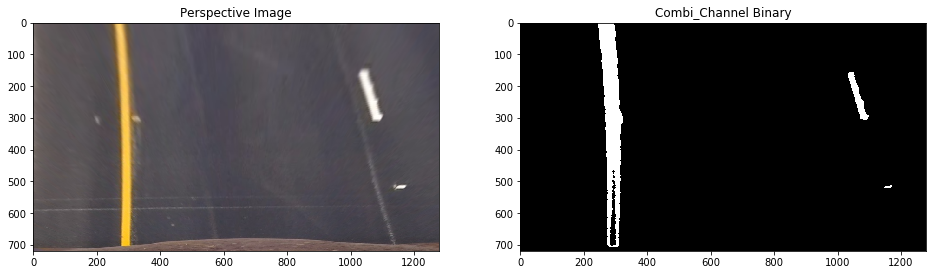

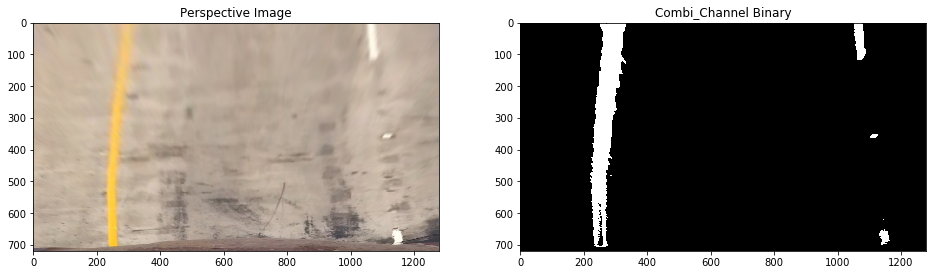

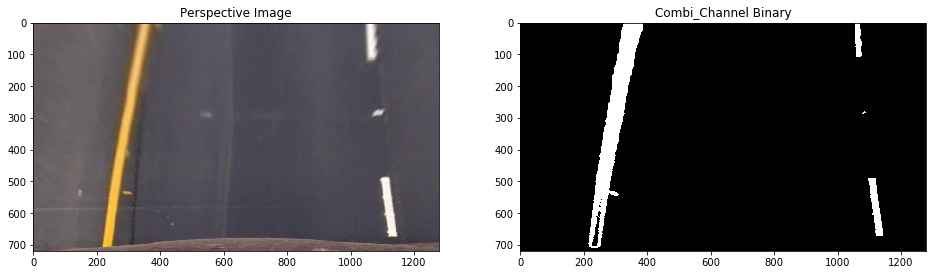

In [44]:
combi_channel = []
for l_chn,b_chn in zip(l_binary,b_binary):
    combi_channel.append(combine_channel(l_chn, b_chn))

combi_channel = np.array(combi_channel)
# Display S_channel detection capabilites
plotsample(warp_img, combi_channel, sample=6, orglabel="Perspective Image", modlabel="Combi_Channel Binary", figsize=(16,9), singlechannel=True)

## Fit a polynomial to the detected lanes

In this section the combined channel binary is used fit a polynomial using the sliding window and histogram method. The radius of cutvature is calculated using the polynomial of one of the lanes.

In [97]:
def getlane(binary_warped):
    '''
    This function returns the polynomials of a left and right lane if detected.
    Returns the polynomial
    '''
    # Take a histogram of the bottom half of the image
    bottom_half = np.int(binary_warped.shape[0]/2)
    histogram = np.sum(binary_warped[bottom_half:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(51, 204, 51), 2)
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(255, 0, 255), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy

In [98]:
def plot_poly(binary_warped, left_lane_inds, right_lane_inds, margin=100, figsize=(16,9)):
    '''
    Function to plot poly filled lane lanes with windows
    '''
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (255, 51, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (255, 51, 0))
    result = cv2.addWeighted(out_img, 0.7, window_img, 0.3, 0)
    figure, (axs1, axs2) = plt.subplots(1,2, figsize=figsize)
    axs1.imshow(binary_warped, cmap='gray')
    axs1.set_title("Binary_Warped")
    axs2.imshow(result)
    axs2.plot(left_fitx, ploty, color='yellow')
    axs2.plot(right_fitx, ploty, color='yellow')
    axs2.set_xlim(0, binary_warped.shape[1])
    axs2.set_ylim(binary_warped.shape[0], 0)
    axs2.set_title("Detected Lane and Window")

In [47]:
fit_data = []
for img in combi_channel:
    left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = getlane(img)
    fit_data.append([left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy])
fit_data = np.array(fit_data)

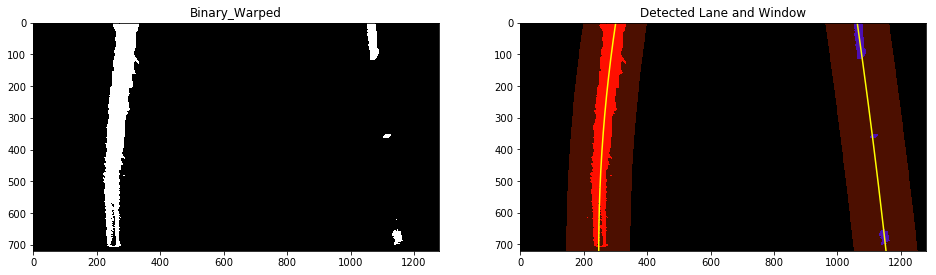

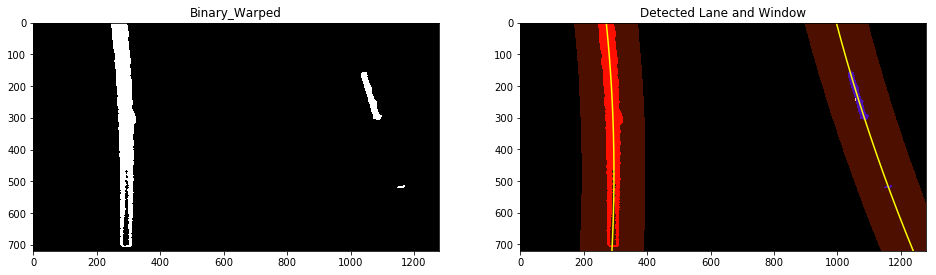

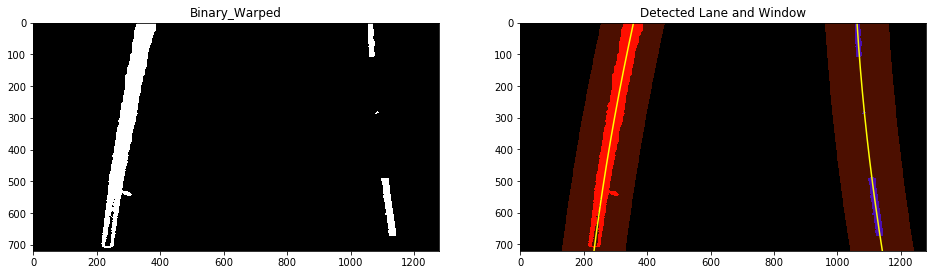

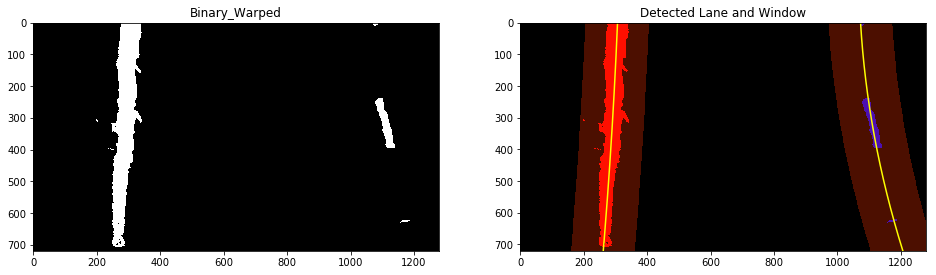

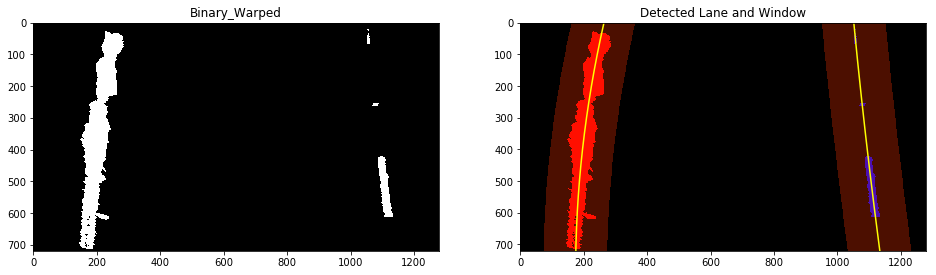

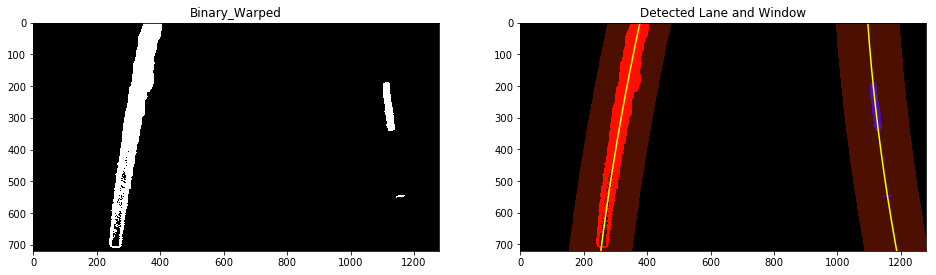

In [48]:
# Plot Fit Data
for img, fit_d in zip(combi_channel, fit_data):
    left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = fit_d
    plot_poly(img, left_lane_inds, right_lane_inds, margin=100, figsize=(16,9))

## Identify Radius of Curvature, Vehicle Position w.r.t Lane

In this section the lane radius of curvature is identified and vehicle position with respect to lane is identified

In [99]:
def calc_rcurv_offset(binary_warped, left_fit, right_fit):
    '''
    This function calculates the radius of curvature and Vehicle position
    with respect to the lane.
    
    US regulation - minimum lane width is 3.7 meters
    Dashed Lanes are 3 meters long
    
    Radius of curvature R = ((1+(2Ay+B)^2)^3/2)/|2A|
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 720 # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_fitx = left_fitx[::-1]
    right_fitx = right_fitx[::-1]
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the new radius of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    
    avg_curv = int((left_curverad + right_curverad)/2)
    
    # Vehicle Position
    # Assumption camera in the center
    lmean = np.mean(left_fitx)
    rmean = np.mean(right_fitx)
    lane_center = np.mean([lmean, rmean])
    img_center = binary_warped.shape[1] / 2
    vehicle_pos = (img_center - lane_center) * xm_per_pix
    print(avg_curv, 'm', vehicle_pos, 'm')
    
    return(avg_curv, vehicle_pos)
    

In [50]:
r_curv = []
v_cent = []
for idx, warped in enumerate(combi_channel):
    left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = fit_data[idx]
    avg_curv, vehicle_pos = calc_rcurv_offset(warped, left_fit, right_fit)
    r_curv.append(avg_curv)
    v_cent.append(vehicle_pos)

4677 m -0.251125674325 m
1566 m -0.312618911316 m
2531 m -0.279095530144 m
3357 m -0.346898405851 m
3833 m -0.0472274077017 m
2386 m -0.43706832333 m


In [51]:
def plotdetectlane(warped, left_fit, right_fit, img, und_img, radius, veh_center, figsize=(16,9)):
    '''
    This function, plots the detected lane and lane information
    '''
    src = np.float32([[490, 485], [810, 485], [1250, 720], [100, 720]])
    dst = np.float32([[0,0], [1280,0], [1250, 720], [100, 720]])
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(und_img, 1, newwarp, 0.5, 0)
    figure, axs1 = plt.subplots(1,1, figsize=figsize)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    vcent = "Vehicle Center".ljust(20) + ": " + str(np.round(vehicle_pos,decimals=2)) + " m"
    rcurv = "Lane Curvature".ljust(20) + ": " + str(radius) + " m"
    axs1.text(100,100, vcent, style='italic', color='white', fontsize=15)
    axs1.text(100,150, rcurv, style='italic', color='white', fontsize=15)
    
    return Minv, pts, left_fitx, right_fitx

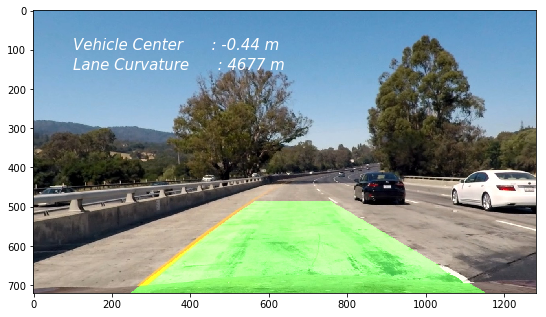

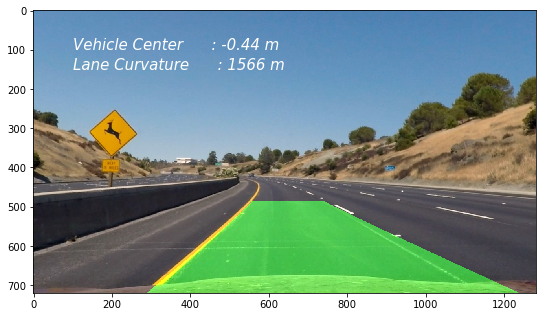

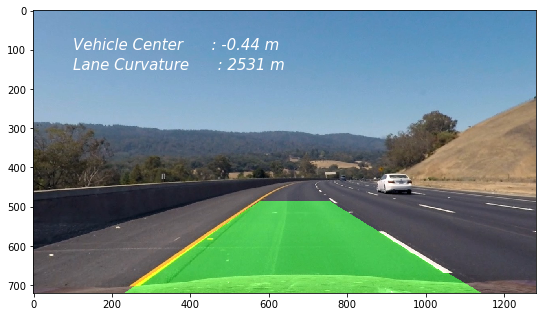

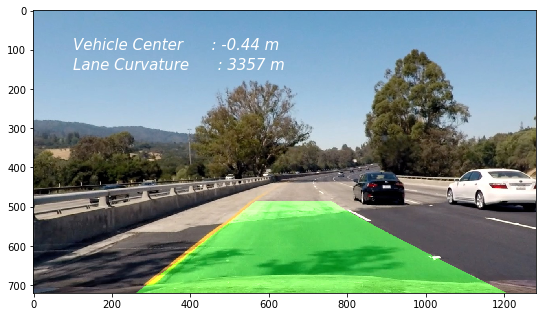

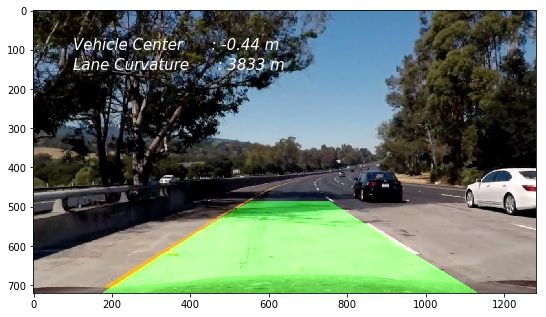

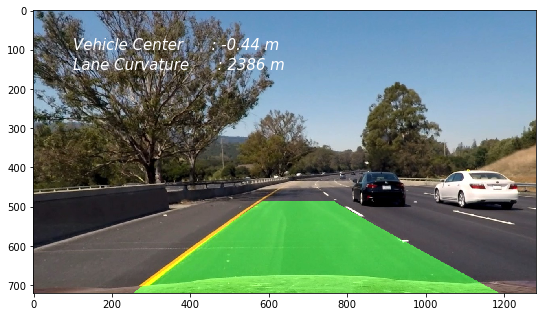

In [52]:
for idx, warped in enumerate(combi_channel):
    left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy = fit_data[idx]
    Minv = persp_mat[idx]
    img = test_images[idx]
    und_img = undist_images[idx]
    plotdetectlane(warped, left_fit, right_fit, img, und_img, r_curv[idx], v_cent[idx], figsize=(9,6))

## Implement Pipeline

In this section the pipe line that is idenfies is implemented in a python file and imported as module. This pipeline will be used by the video processing module

In [2]:
# for debugging
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
import glob
import os
%matplotlib inline

test_path = glob.glob(os.path.join('test_images', 'test*.jpg'))
test_images = []
for impath in test_path:
    img = cv2.imread(impath)
    test_images.append(img.copy())

test_images = np.array(test_images)

In [4]:
from lanedetector.lanepipe import laneDetector
from moviepy.editor import VideoFileClip

# Peform Camera Calibration
chessimg = glob.glob(os.path.join('camera_cal', 'calibration*.jpg'))

# Create an Object of Lane Detector
src = np.float32([[490, 485], [810, 485], [1250, 720], [100, 720]])
dst = np.float32([[0,0], [1280,0], [1250, 720], [100, 720]])
LaneDetector = laneDetector(src, dst)
LaneDetector.calibrate_camera(chessimg)

Lane Detector : Camera Calibration Completed


## Project Video

In [3]:
project_video = "project_video.mp4"
project_output = "project_video_out.mp4"
clip1 = VideoFileClip(project_video)
project_clip = clip1.fl_image(LaneDetector.runpipeline)
project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [18:48<00:00,  1.13it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 



## Challenge Video

In [2]:
from lanedetector.lanepipe import laneDetector
from moviepy.editor import VideoFileClip

# Peform Camera Calibration
chessimg = glob.glob(os.path.join('camera_cal', 'calibration*.jpg'))

# Create an Object of Lane Detector
src = np.float32([[490, 485], [810, 485], [1250, 720], [100, 720]])
dst = np.float32([[0,0], [1280,0], [1250, 720], [100, 720]])
LaneDetector = laneDetector(src, dst)
LaneDetector.calibrate_camera(chessimg)

challenge_video = "challenge_video.mp4"
challenge_output = "challenge_video_out.mp4"
clip1 = VideoFileClip(challenge_video)
challenge_clip = clip1.fl_image(LaneDetector.runpipeline)
challenge_clip.write_videofile(challenge_output, audio=False)

Lane Detector : Camera Calibration Completed
[MoviePy] >>>> Building video challenge_video_out.mp4
[MoviePy] Writing video challenge_video_out.mp4


100%|██████████| 485/485 [07:41<00:00,  1.00s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out.mp4 



## Harder Challenge

In [3]:
from lanedetector.lanepipe import laneDetector
from moviepy.editor import VideoFileClip

# Peform Camera Calibration
chessimg = glob.glob(os.path.join('camera_cal', 'calibration*.jpg'))

# Create an Object of Lane Detector
src = np.float32([[490, 485], [810, 485], [1250, 720], [100, 720]])
dst = np.float32([[0,0], [1280,0], [1250, 720], [100, 720]])
LaneDetector = laneDetector(src, dst)
LaneDetector.calibrate_camera(chessimg)

challenge_video = "harder_challenge_video.mp4"
challenge_output = "harder_challenge_video_out.mp4"
clip1 = VideoFileClip(challenge_video)
challenge_clip = clip1.fl_image(LaneDetector.runpipeline)
challenge_clip.write_videofile(challenge_output, audio=False)

Lane Detector : Camera Calibration Completed
[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4


100%|█████████▉| 1199/1200 [22:25<00:00,  1.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 

